In [33]:
import warnings
warnings.filterwarnings('ignore')

In [34]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [35]:
df= pd.read_excel("data.xlsx")
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [36]:
df =df.drop(['ID',"Unnamed: 0"],axis=1)

In [37]:
df['DOL'].replace({'present':'2021'}, inplace=True)

In [38]:
df['DOL'] = pd.to_datetime(df['DOL'])

In [39]:
df

,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,420000,2012-06-01,2021-01-01,senior quality engineer,Bangalore,f,1990-02-19,84.30,"board ofsecondary education,ap",2007,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,500000,2013-09-01,2021-01-01,assistant manager,Indore,m,1989-10-04,85.40,cbse,2007,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,325000,2014-06-01,2021-01-01,systems engineer,Chennai,f,1992-08-03,85.00,cbse,2010,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,1100000,2011-07-01,2021-01-01,senior software engineer,Gurgaon,m,1989-12-05,85.60,cbse,2007,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,200000,2014-03-01,2015-03-01,get,Manesar,m,1991-02-27,78.00,cbse,2008,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,280000,2011-10-01,2012-10-01,software engineer,New Delhi,m,1987-04-15,52.09,cbse,2006,...,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,100000,2013-07-01,2013-07-01,technical writer,Hyderabad,f,1992-08-27,90.00,state board,2009,...,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,320000,2013-07-01,2021-01-01,associate software engineer,Bangalore,m,1991-07-03,81.86,"bse,odisha",2008,...,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,200000,2014-07-01,2015-01-01,software developer,Asifabadbanglore,f,1992-03-20,78.72,state board,2010,...,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


In [40]:
df.dtypes

Salary                            int64
DOJ                      datetime64[ns]
DOL                      datetime64[ns]
Designation                      object
JobCity                          object
Gender                           object
DOB                      datetime64[ns]
10percentage                    float64
10board                          object
12graduation                      int64
12percentage                    float64
12board                          object
CollegeID                         int64
CollegeTier                       int64
Degree                           object
Specialization                   object
collegeGPA                      float64
CollegeCityID                     int64
CollegeCityTier                   int64
CollegeState                     object
GraduationYear                    int64
English                           int64
Logical                           int64
Quant                             int64
Domain                          float64


In [42]:
catg_var=[]
num_var=[]
date_time=[]

for col in df.columns:
        if (df[col].dtypes == 'object'):
            catg_var.append(col)
        elif (df[col].dtypes =='datetime64[ns]'):
            date_time.append(col)
        else:
            num_var.append(col)

In [43]:
print(catg_var)

['Designation', 'JobCity', 'Gender', '10board', '12board', 'Degree', 'Specialization', 'CollegeState']


In [44]:
print(date_time)

['DOJ', 'DOL', 'DOB']


In [45]:
print(num_var)

['Salary', '10percentage', '12graduation', '12percentage', 'CollegeID', 'CollegeTier', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier', 'GraduationYear', 'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience']


# Univariate Analysis

## Numerical Analysis

### Distplot

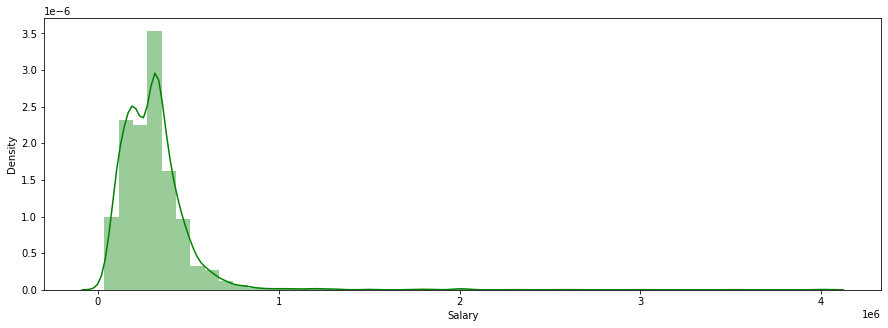

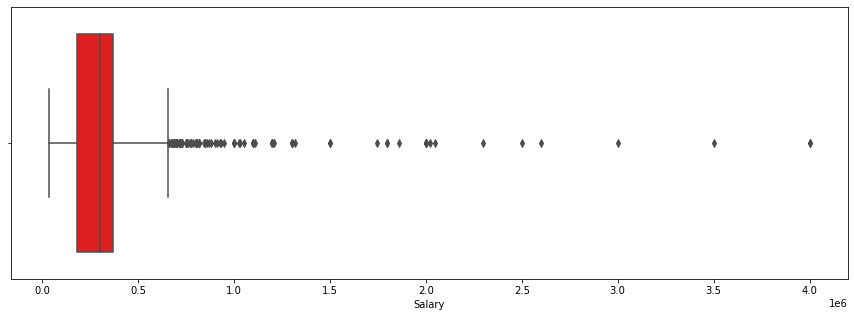

In [53]:
# Distribution of Salary
plt.figure(figsize=(15,5))
sns.distplot(df.Salary,hist=True,kde=True,color="g")
plt.show()

# To find out the range
plt.figure(figsize=(15,5))
sns.boxplot(df.Salary,color="r")
plt.show()


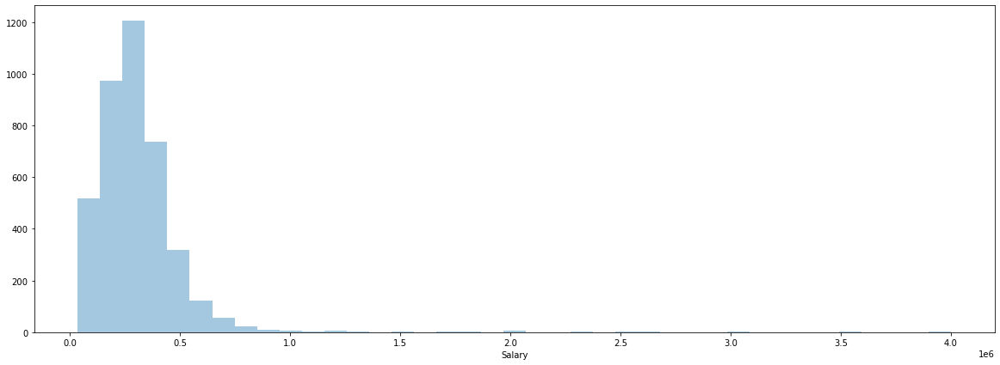

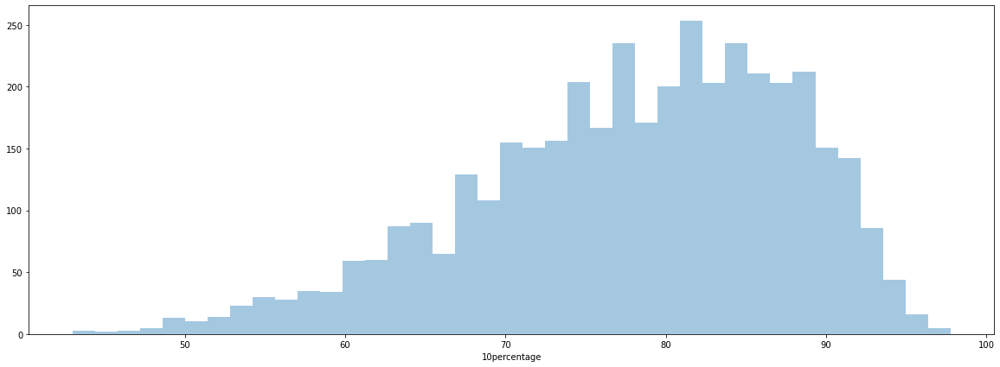

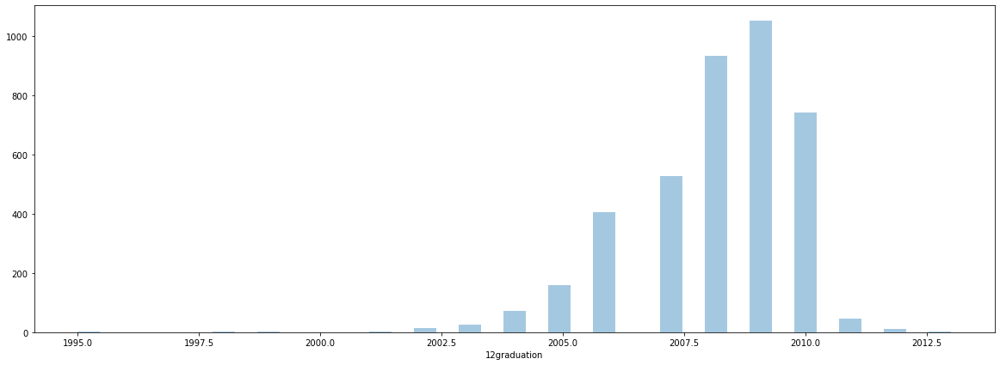

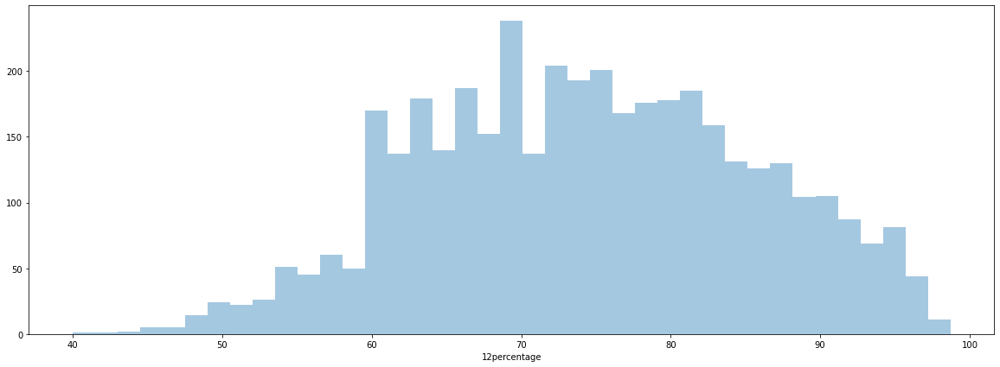

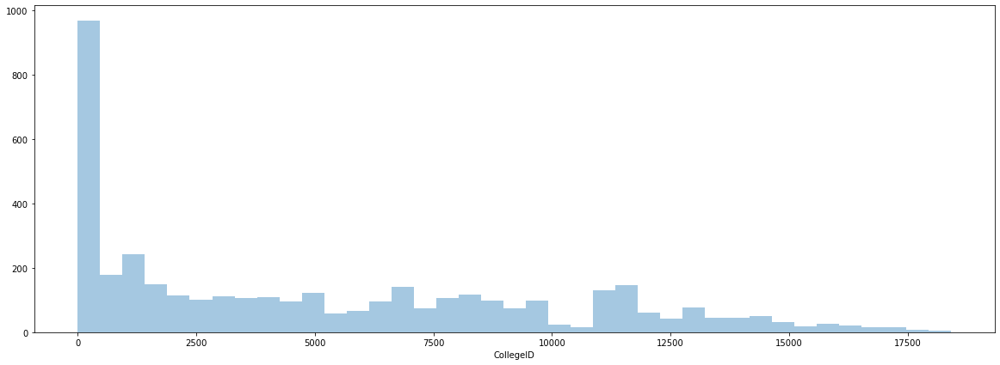

...

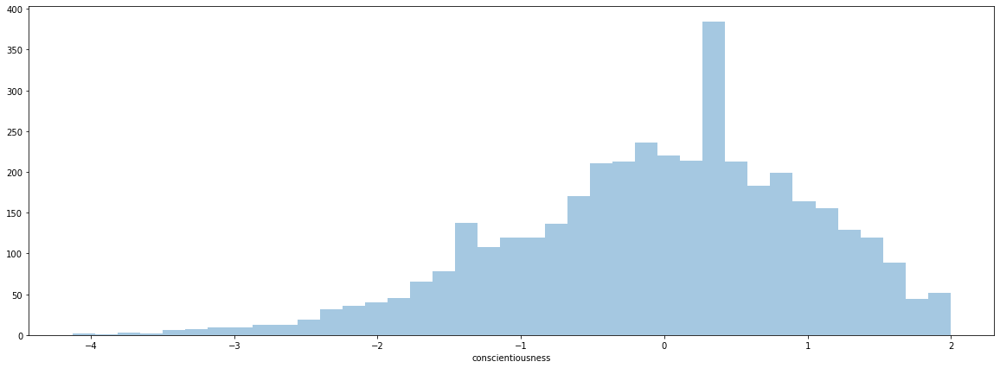

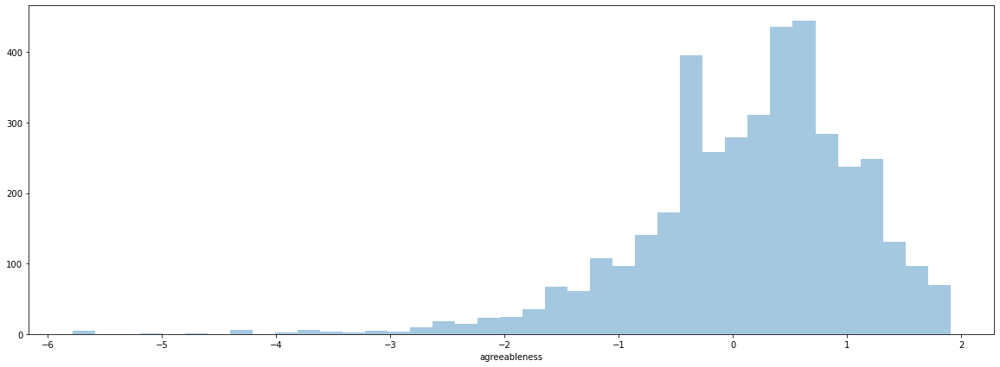

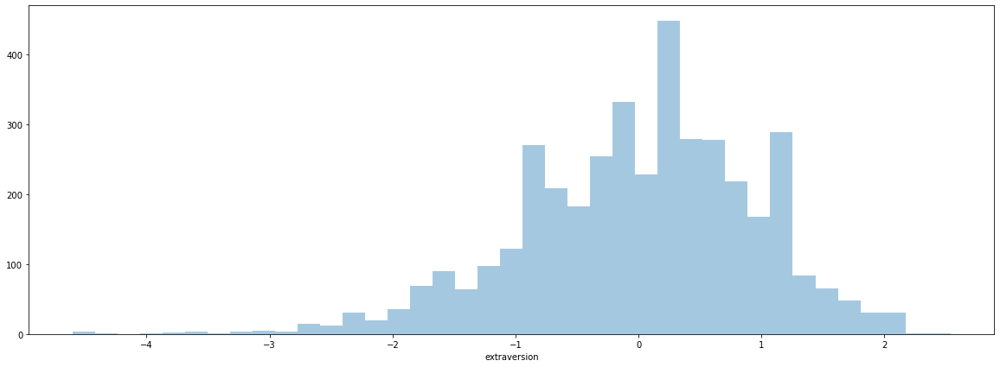

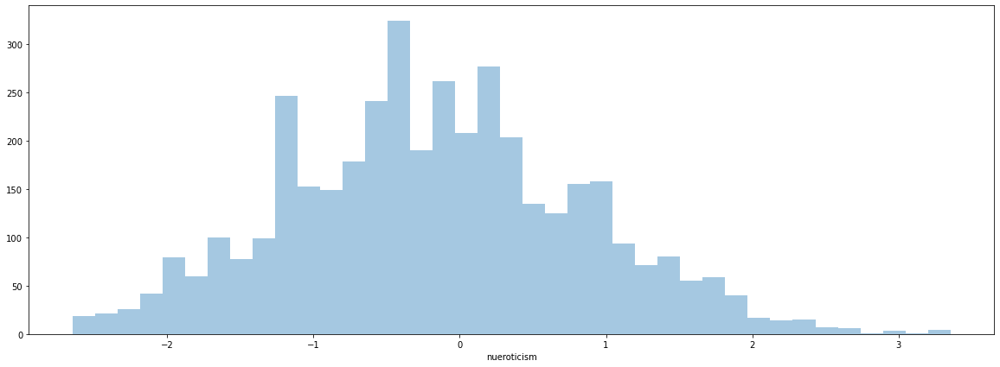

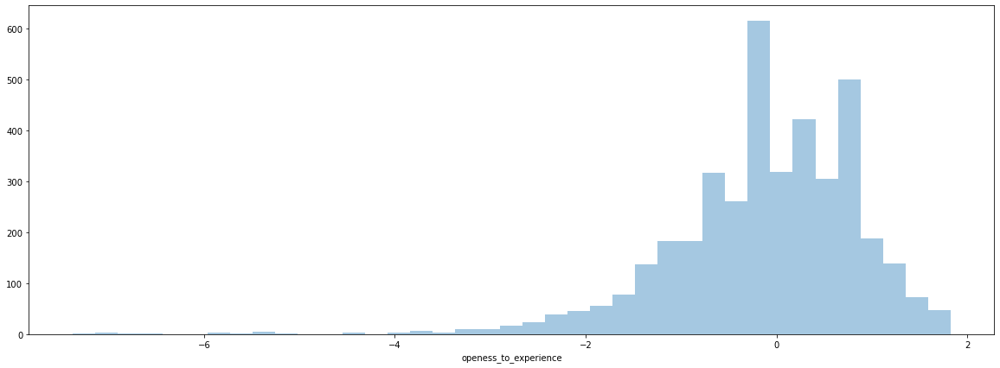

In [49]:
for i in num_var:
    plt.figure(figsize=(20,7))
    sns.distplot(df[i].dropna(),kde=False,bins=39)

### Histogram

(array([ 12.,  50., 132., 240., 446., 636., 811., 850., 677., 144.]),
 array([43.   , 48.476, 53.952, 59.428, 64.904, 70.38 , 75.856, 81.332,
        86.808, 92.284, 97.76 ]),
 <BarContainer object of 10 artists>)

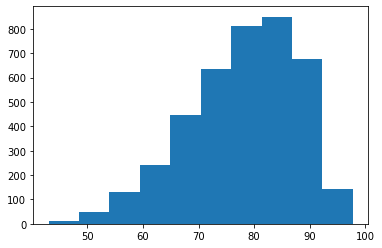

In [5]:
plt.hist(df["10percentage"])

## Categorical Analysis

### Pie Chart

([<matplotlib.patches.Wedge at 0x1a96bc36fa0>,
 [Text(0.599046201046741, 0.9225744680032436, 'software engineer'),
  Text(-0.8672005539532778, 0.6767297830176594, 'software developer'),
  Text(-1.0769925073829816, -0.22380156174816743, 'system engineer'),
  Text(-0.7343320342051123, -0.8189972304838289, 'programmer analyst'),
  Text(-0.2791403523685677, -1.0639927930580884, 'systems engineer'),
  Text(0.18189717505173894, -1.0848564041882214, 'java software engineer'),
  Text(0.5801919153898676, -0.9345465966532844, 'software test engineer'),
  Text(0.8494252200516093, -0.6989111499613349, 'project engineer'),
  Text(1.0105433600630815, -0.43451365620935023, 'technical support engineer'),
  Text(1.0903000515240002, -0.1457593827057547, 'senior software engineer')],
 [Text(0.3267524732982223, 0.5032224370926782, '31.7%'),
  Text(-0.47301848397451507, 0.36912533619145055, '15.6%'),
  Text(-0.5874504585725353, -0.12207357913536404, '12.0%'),
  Text(-0.4005447459300612, -0.4467257620820884

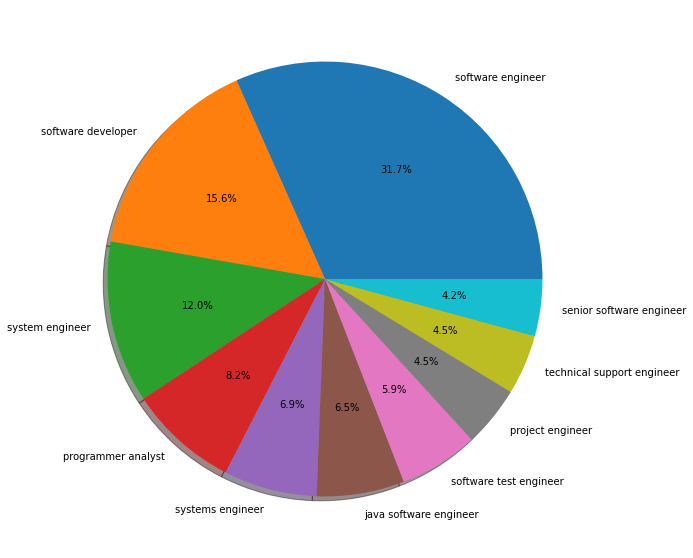

In [50]:
labels = ['software engineer','software developer','system engineer','programmer analyst',
          'systems engineer','java software engineer','software test engineer','project engineer',
         'technical support engineer','senior software engineer']
plt.figure(figsize=(10,10))
plt.pie(df['Designation'].value_counts().head(10),labels=labels,shadow=True,autopct='%1.1f%%')

### Barplot

<AxesSubplot:>

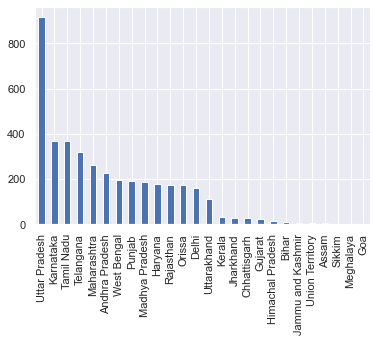

In [39]:
df["CollegeState"].value_counts().plot.bar()

### Count Plot

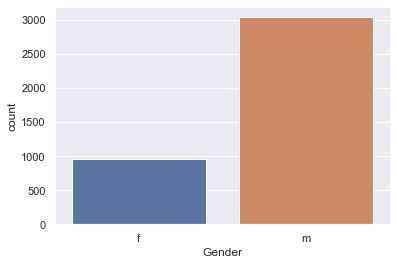

In [38]:
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="Gender", data=df)

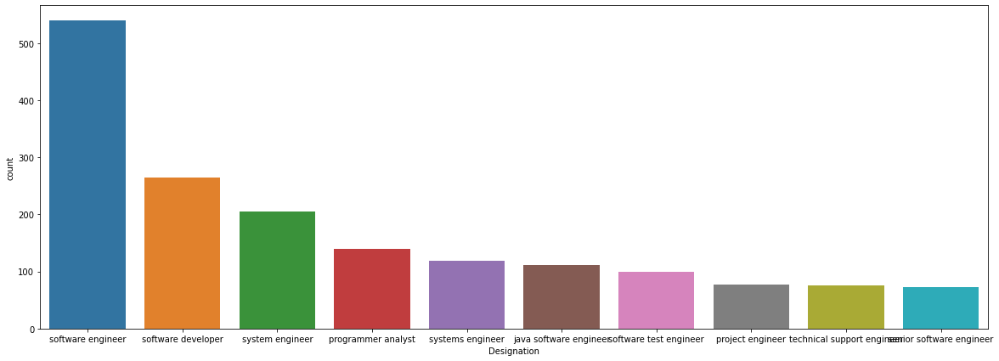

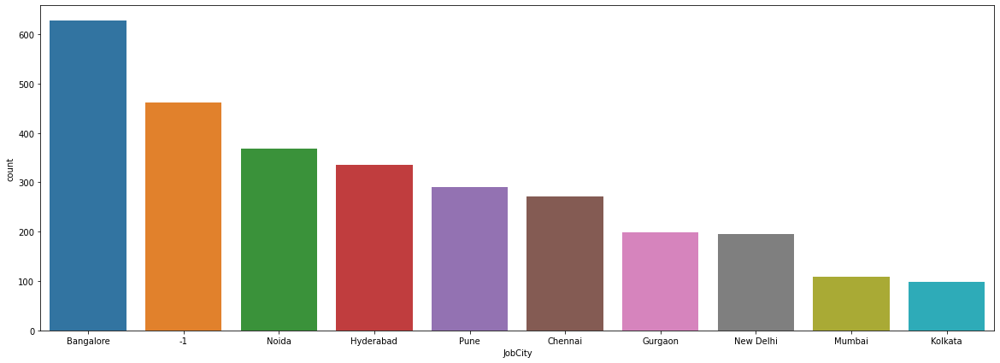

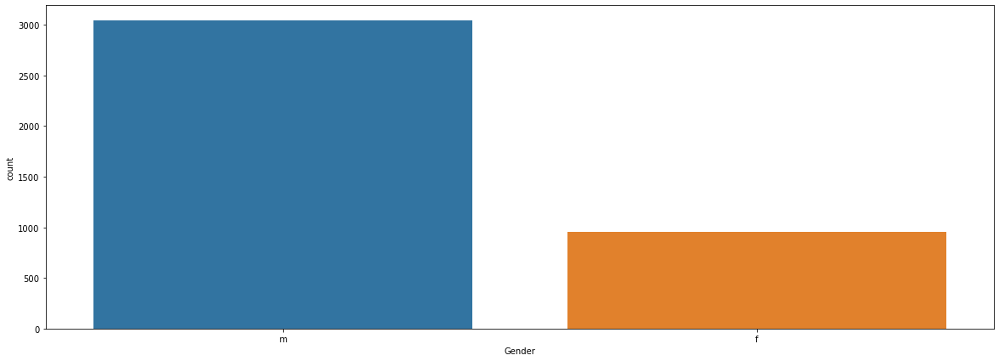

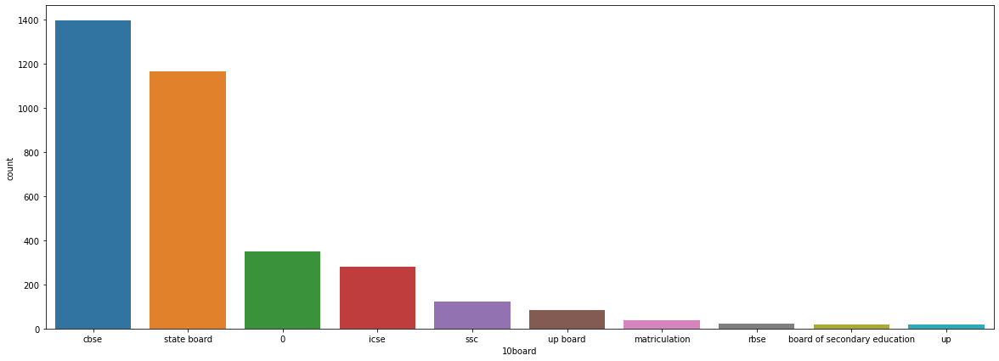

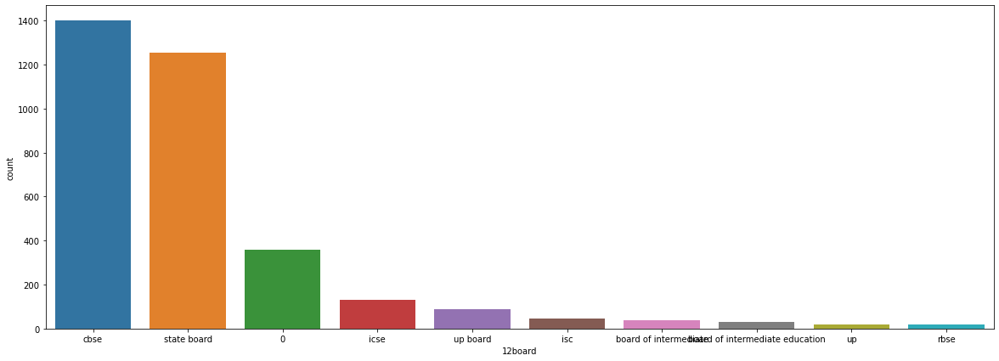

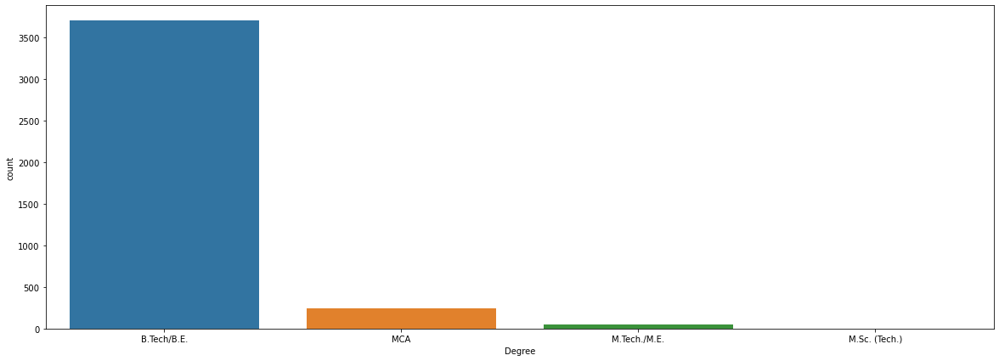

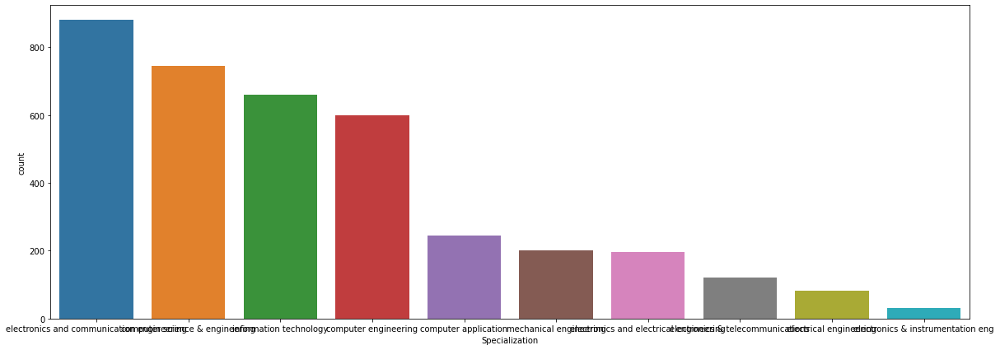

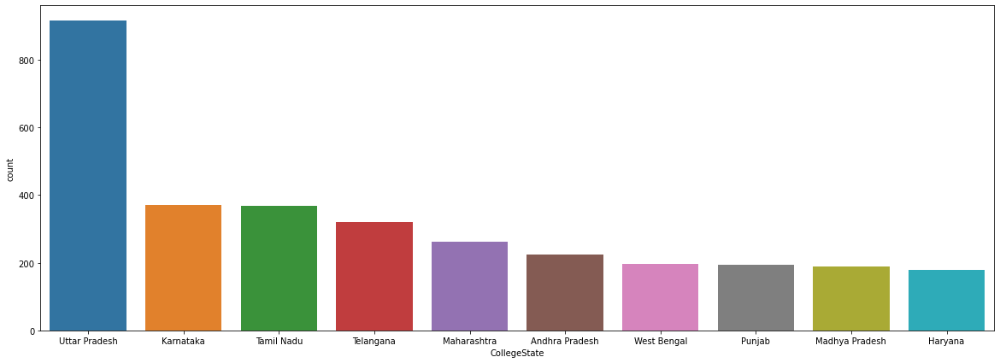

In [48]:
for i in catg_var:
    plt.figure(figsize=(20,7))
    sns.countplot(df[i].dropna(), order=df[i].value_counts().iloc[:10].index)

# Bivariate Analysis

### Numerical vs Numerical variables

### Scatter plot

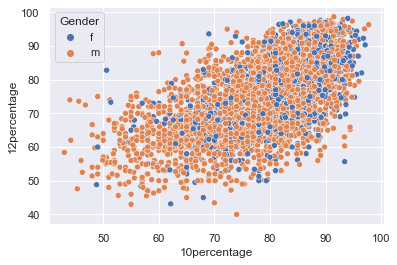

In [46]:
sns.scatterplot(x="10percentage",y="12percentage",data=df,hue="Gender")
plt.show()

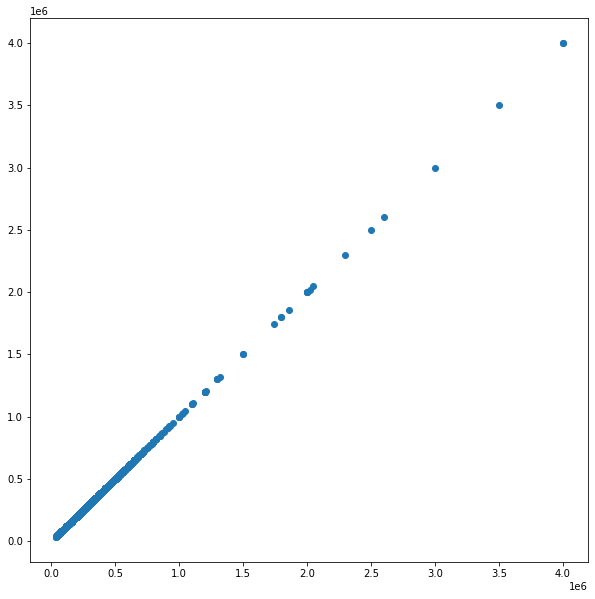

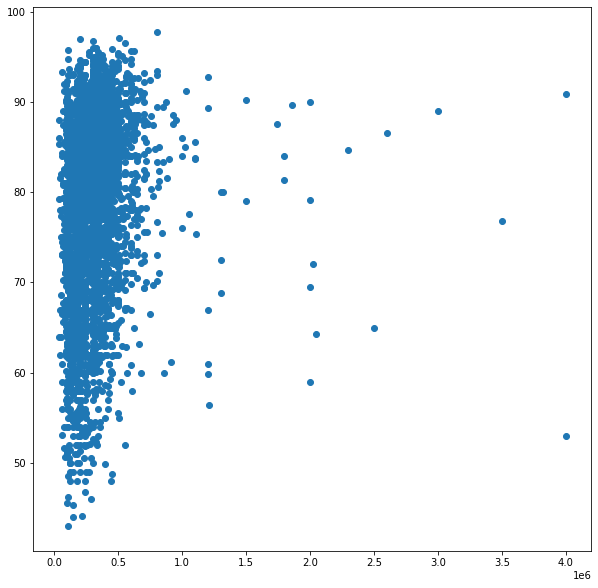

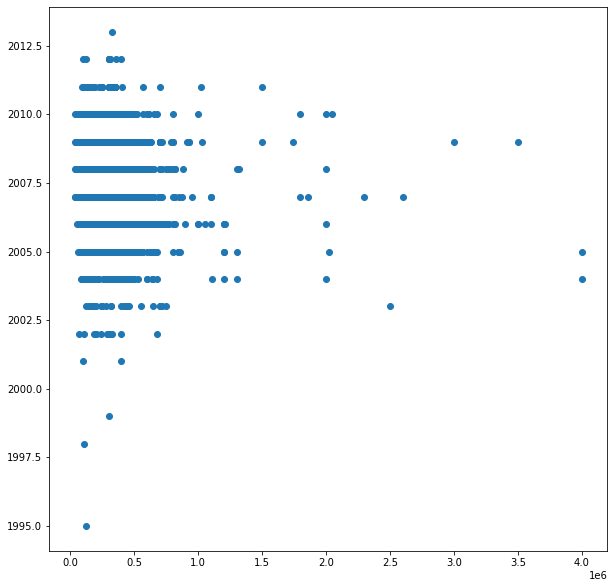

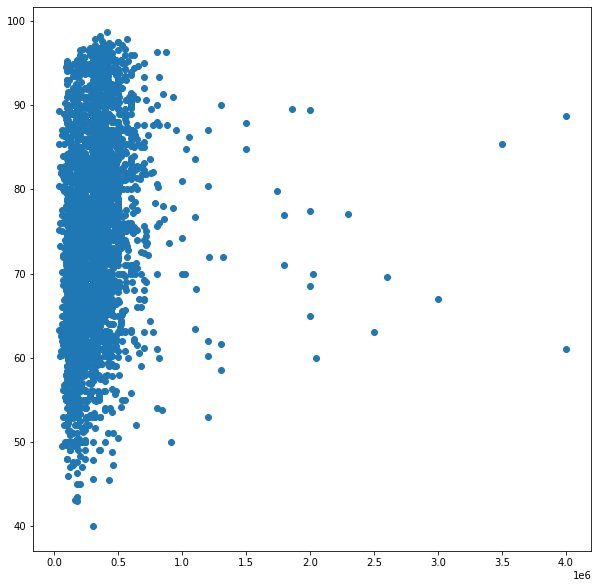

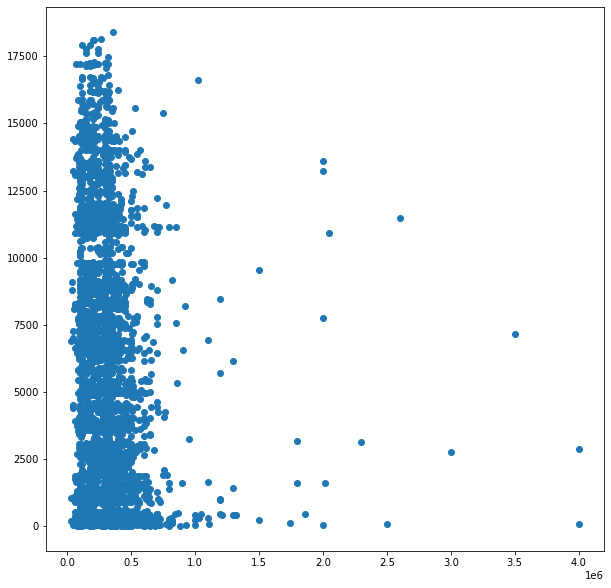

...

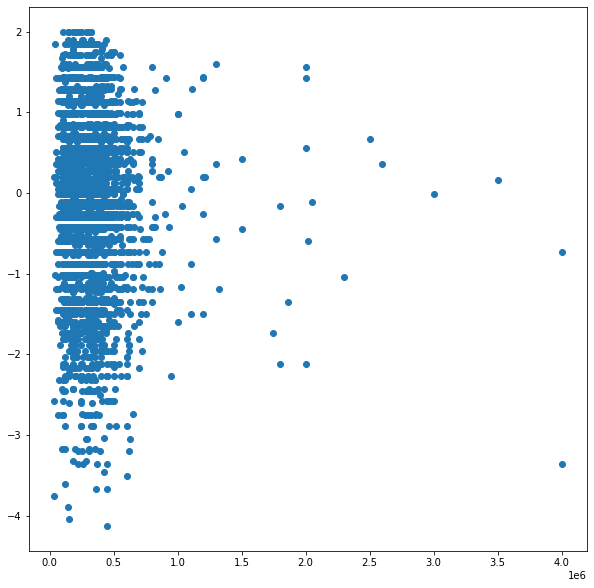

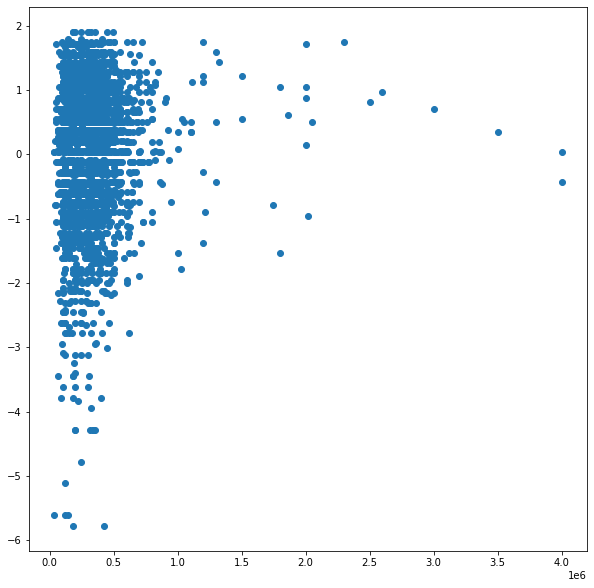

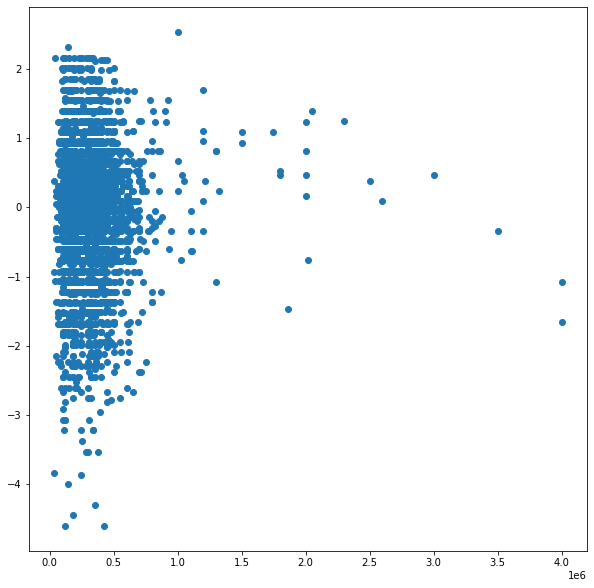

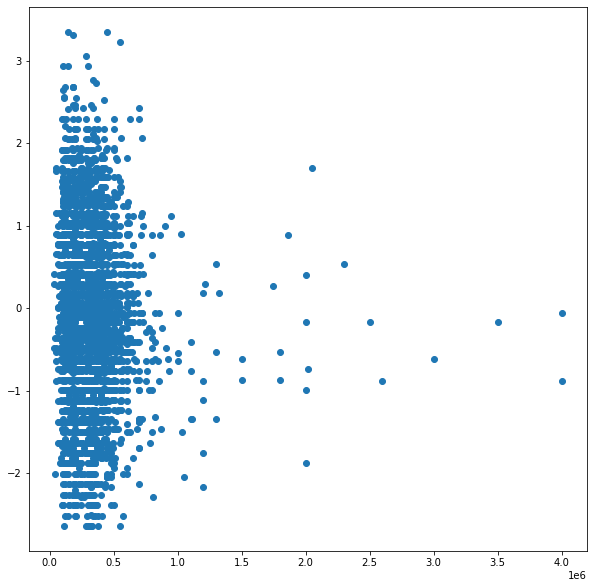

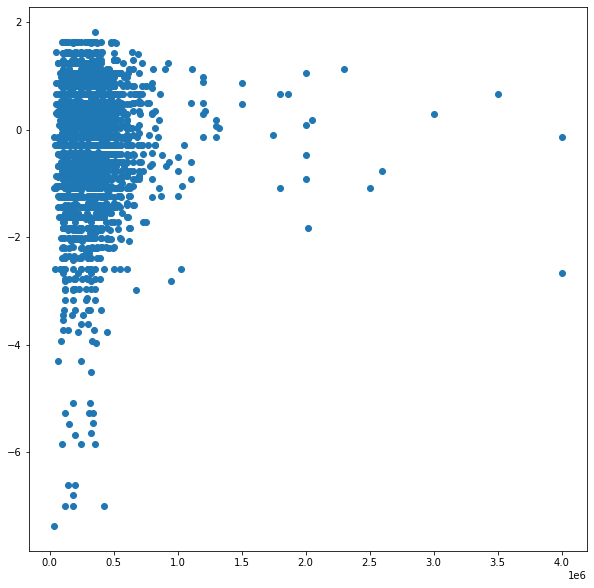

In [54]:
for i in num_var:
    plt.figure(figsize=(10,10))
    x=df['Salary']
    y=df[i]
    plt.scatter(x,y)

### Categorical vs Categorical

### Catplot

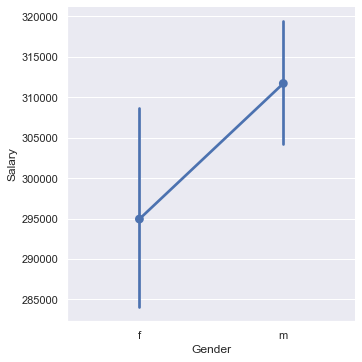

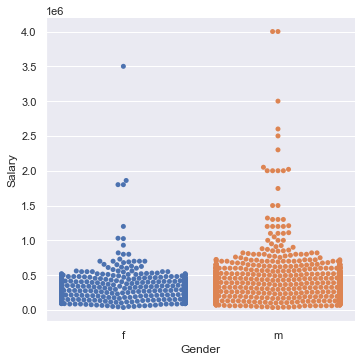

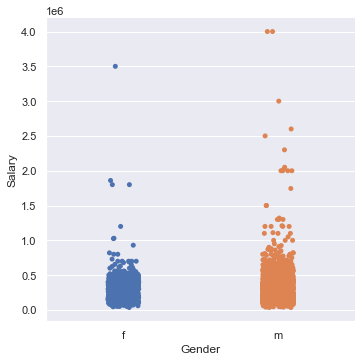

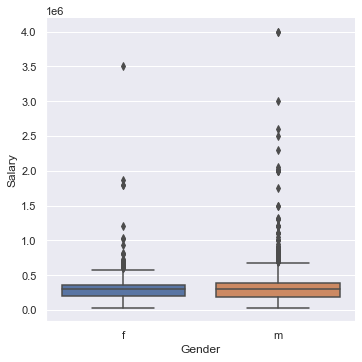

In [70]:
# Using catplot to compare categorical data with numerical data
sns.catplot(x="Gender",y="Salary",kind="point",data=df)
plt.show()

sns.catplot(x="Gender",y="Salary",kind="swarm",data=df)
plt.show()

sns.catplot(x="Gender",y="Salary",kind="strip",data=df)
plt.show()

sns.catplot(x="Gender",y="Salary",kind="box",data=df)
plt.show()


### Categorical vs Numerical 

### Pairplot

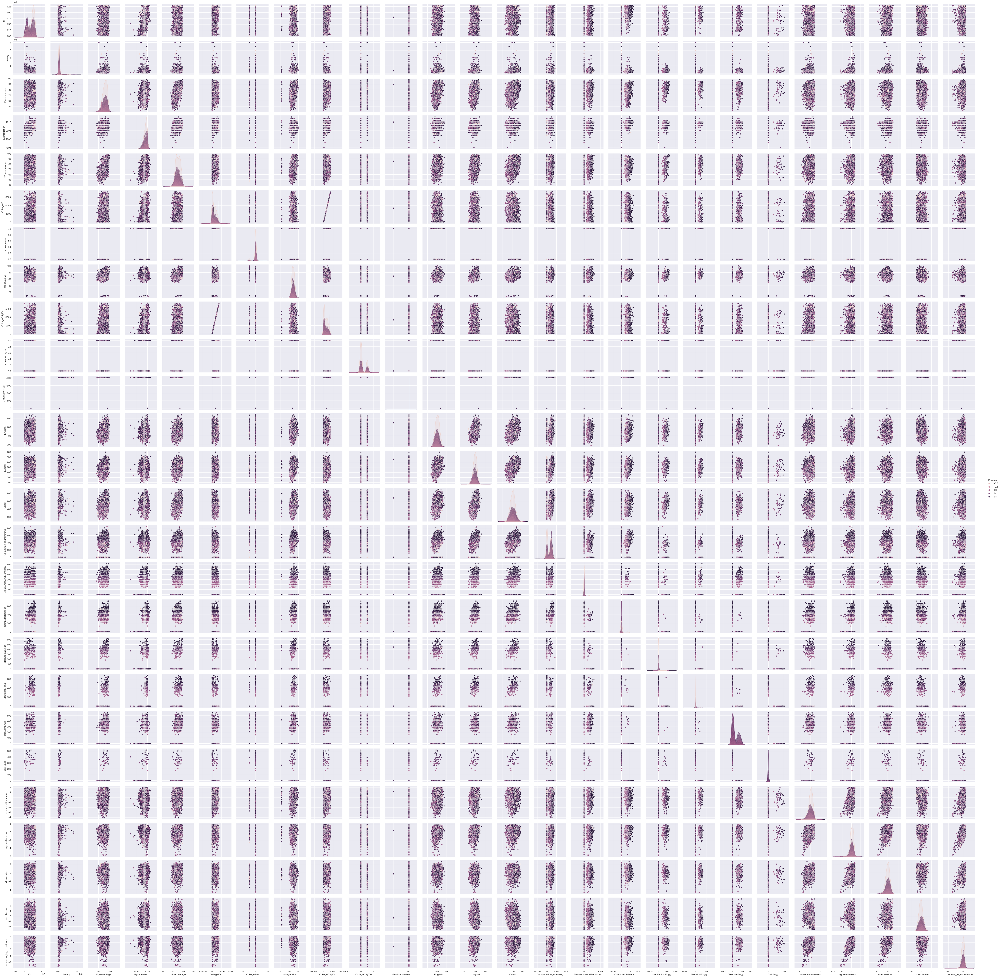

In [71]:
sns.pairplot(df,hue="Domain")
plt.show()